In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hubmap-kidney-segmentation/sample_submission.csv
/kaggle/input/hubmap-kidney-segmentation/HuBMAP-20-dataset_information.csv
/kaggle/input/hubmap-kidney-segmentation/train.csv
/kaggle/input/hubmap-kidney-segmentation/test/afa5e8098.tiff
/kaggle/input/hubmap-kidney-segmentation/test/b9a3865fc-anatomical-structure.json
/kaggle/input/hubmap-kidney-segmentation/test/b9a3865fc.tiff
/kaggle/input/hubmap-kidney-segmentation/test/afa5e8098-anatomical-structure.json
/kaggle/input/hubmap-kidney-segmentation/test/c68fe75ea.tiff
/kaggle/input/hubmap-kidney-segmentation/test/26dc41664-anatomical-structure.json
/kaggle/input/hubmap-kidney-segmentation/test/c68fe75ea-anatomical-structure.json
/kaggle/input/hubmap-kidney-segmentation/test/b2dc8411c-anatomical-structure.json
/kaggle/input/hubmap-kidney-segmentation/test/b2dc8411c.tiff
/kaggle/input/hubmap-kidney-segmentation/test/26dc41664.tiff
/kaggle/input/hubmap-kidney-segmentation/train/0486052bb-anatomical-structure.json
/kaggle/input

**Credits**
* https://www.kaggle.com/xhlulu/hubmap-break-down-images-into-512x512-tiles
* https://www.kaggle.com/iafoss/256x256-images
* https://www.kaggle.com/lifa08/run-length-encode-and-decode
* https://www.kaggle.com/pestipeti/decoding-rle-masks

**What is RLE?**
Run-length encoding (RLE) is a form of lossless data compression in which runs of data (sequences in which the same data value occurs in many consecutive data elements) are stored as a single data value and count, rather than as the original run. For Eg:  [0,0,0,0,0,1,1,1,1,0] => [5,0,4,1,1,0]

**What is mask?**
mask is used to focus on particular area. In a mask 0 means background 1 means mask. So when you apply a mask on an image you can clearly see pixels where the value of mask is 0. In this case you can clearly see glomeruli  when we apply mask on the image.

**Why we are creating tiles instead of using the whole image?**
The size of these tiff images is more than 4GB. In fact you wont be able to open these images in OpenCV. Loading these images into the ram and then process them without crashing your notebook is not possible. So we are dividing these images into the tiles.

In [2]:
import os
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import cv2
import tifffile as tiff
%matplotlib inline

In [3]:
MASKS = '../input/hubmap-kidney-segmentation/train.csv'
Train_Data = '../input/hubmap-kidney-segmentation/train'
Test_Data = '../input/hubmap-kidney-segmentation/test'
test = '/kaggle/input/hubmap-kidney-segmentation/sample_submission.csv'

In [4]:
train_df = pd.read_csv(MASKS)
train_df

,id,encoding
0,2f6ecfcdf,296084587 4 296115835 6 296115859 14 296147109...
1,aaa6a05cc,30989109 59 31007591 64 31026074 68 31044556 7...
2,cb2d976f4,78144363 5 78179297 15 78214231 25 78249165 35...
3,0486052bb,101676003 6 101701785 8 101727568 9 101753351 ...
4,e79de561c,7464094 14 7480273 41 7496453 67 7512632 82 75...
5,095bf7a1f,113430380 22 113468538 67 113506697 111 113544...
6,54f2eec69,124601765 36 124632133 109 124662536 147 12469...
7,1e2425f28,49453112 7 49479881 22 49506657 31 49533433 40...


In [5]:
def Get_ImageId(file_name):
    df = pd.read_csv(file_name)
    ImageID = [id for id in df['id']]
    return ImageID
train_ImageID = Get_ImageId(MASKS)
test_ImageID = Get_ImageId(test)
print(f"Train_Image_ID = {train_ImageID} \nTest_Image_ID = {test_ImageID}")

Train_Image_ID = ['2f6ecfcdf', 'aaa6a05cc', 'cb2d976f4', '0486052bb', 'e79de561c', '095bf7a1f', '54f2eec69', '1e2425f28'] 
Test_Image_ID = ['b9a3865fc', 'b2dc8411c', '26dc41664', 'c68fe75ea', 'afa5e8098']


In [6]:
#Lets Checkout the size of all the images
print("Training data sets \n")
for id_im in train_ImageID:
    image = tiff.imread('/kaggle/input/hubmap-kidney-segmentation/train/{}.tiff'.format(id_im))
    print(str(image.shape) + '  ' + id_im)
    
print("Testing data set \n")
for id_im in test_ImageID:
    image = tiff.imread('/kaggle/input/hubmap-kidney-segmentation/test/{}.tiff'.format(id_im))
    print(str(image.shape) + ' ' + id_im)

Training data sets 

(31278, 25794, 3)  2f6ecfcdf
(18484, 13013, 3)  aaa6a05cc
(34940, 49548, 3)  cb2d976f4
(25784, 34937, 3)  0486052bb
(1, 1, 3, 16180, 27020)  e79de561c
(1, 1, 3, 38160, 39000)  095bf7a1f
(1, 1, 3, 30440, 22240)  54f2eec69
(1, 1, 3, 26780, 32220)  1e2425f28
Testing data set 

(31295, 40429, 3) b9a3865fc
(14844, 31262, 3) b2dc8411c
(1, 1, 3, 38160, 42360) 26dc41664
(1, 1, 3, 26840, 49780) c68fe75ea
(36800, 43780, 3) afa5e8098


/opt/conda/lib/python3.7/site-packages/rasterio/__init__.py:207: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


<AxesSubplot:>

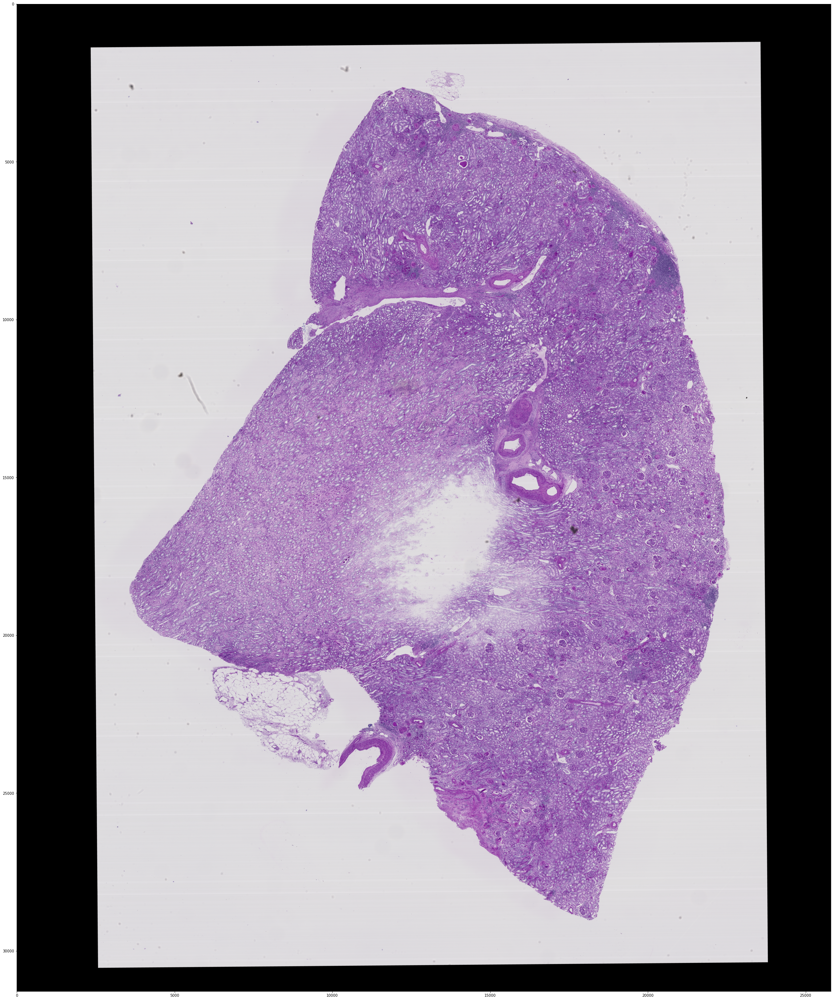

In [7]:
import rasterio
from rasterio.plot import show

img_id = "2f6ecfcdf"
img_2f6ecfcdf = rasterio.open(f"/kaggle/input/hubmap-kidney-segmentation/train/{img_id}.tiff")
fig, ax = plt.subplots(1, 1, figsize=(50, 50))
show(img_2f6ecfcdf, ax=ax)

In [8]:
img_2f6ecfcdf.closed

False

In [9]:
def rle2mask(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [10]:
image = tiff.imread('/kaggle/input/hubmap-kidney-segmentation/train/{}.tiff'.format("2f6ecfcdf"))
image.shape

(31278, 25794, 3)

In [11]:
mask = rle2mask(train_df.iloc[0, 1], (image.shape[1], image.shape[0]))
mask.shape

(31278, 25794)

In [12]:
masked_image = cv2.bitwise_and(image, image, mask=mask)
masked_image.shape

(31278, 25794, 3)

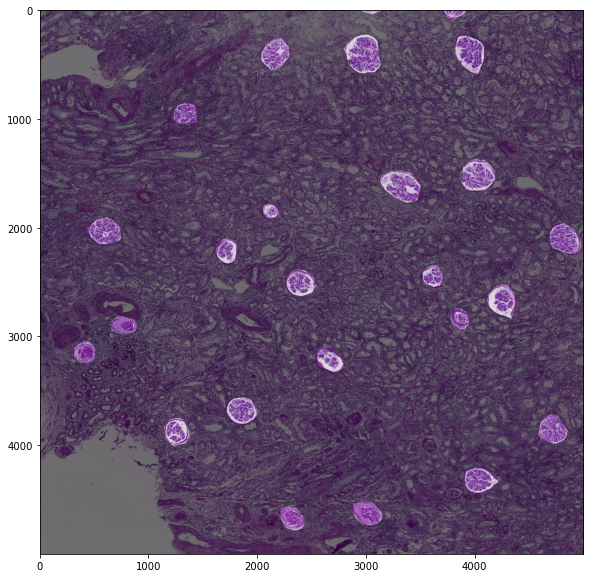

In [13]:
plt.figure(figsize=(20,10))
plt.imshow(image[20000:25000, 12000:17000, :])
plt.imshow(masked_image[20000:25000, 12000:17000], cmap='jet', alpha=0.5)

In [ ]:
def Generate_Tiles(ImageID, path):
    tile_size = 256 # size of a tile will be 512 * 512
    df = pd.read_csv(f"{path}.csv") # Read csv to get rle str
    os.makedirs('train_tiles/images', exist_ok=True) # create folders to save these images
    os.makedirs('train_tiles/masks', exist_ok=True)
    for idx in ImageID: 
        img = tiff.imread(f"{path}/{idx}.tiff")
        img = np.squeeze(img) # Squeeze the dimension to remove (1,1)
        mask = rle2mask(df.loc[train_df.id == idx].iloc[0, 1], (img.shape[1], img.shape[0])) # Generate mask
        x_max, y_max = img.shape[:2] 
        for x0 in range(0, x_max, tile_size):
            x1 = min(x_max, x0 + tile_size) # to make sure that x0 + tile_size  !> x_max 
            for y0 in range(0, y_max, tile_size):
                y1 = min(y_max, y0+tile_size) # to make sure that y0 + tile_size  !> y_max 
                
                img_tile = img[x0:x1, y0:y1]
                mask_tile = mask[x0:x1, y0:y1]
                img_tile_path = f"train_tiles/images/{idx}_{x0}-{x1}x_{y0}-{y1}y.png"
                mask_tile_path = f"train_tiles/masks/{idx}_{x0}-{x1}x_{y0}-{y1}y.png"
                cv2.imwrite(img_tile_path, cv2.cvtColor(img_tile, cv2.COLOR_RGB2BGR)) # Save the file 
                cv2.imwrite(mask_tile_path, mask_tile)

In [ ]:
Generate_Tiles(train_ImageID, Train_Data)